<a href="https://colab.research.google.com/github/Manuprasad01/ML/blob/new/IMAGE_SUPER_RESOLUTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import re
from scipy import ndimage, misc
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array

from skimage.transform import resize, rescale
import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '/content/drive/MyDrive/m_project/dataset/Raw Data/high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '/content/drive/MyDrive/m_project/dataset/Raw Data/low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 855/855 [00:14<00:00, 60.21it/s] 


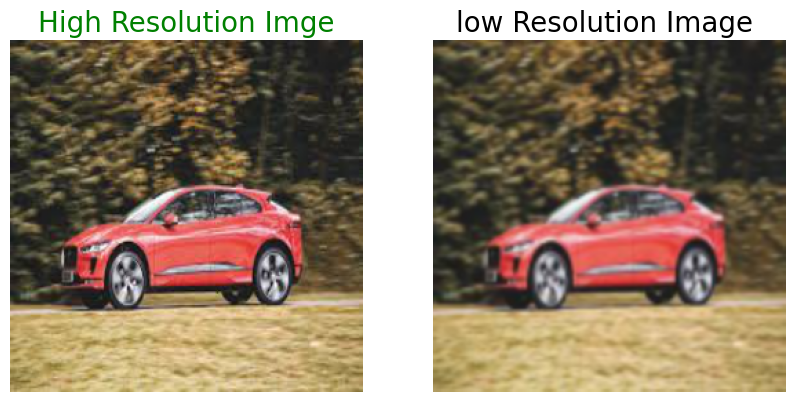

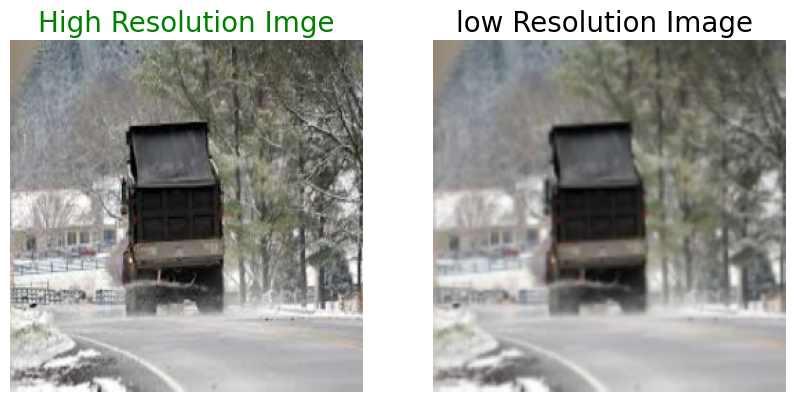

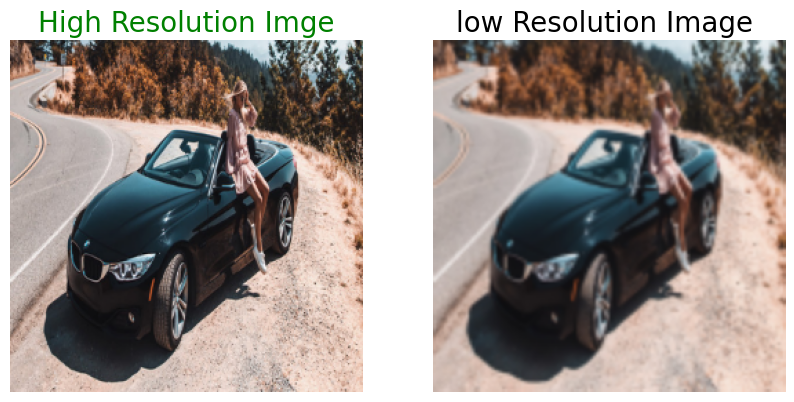

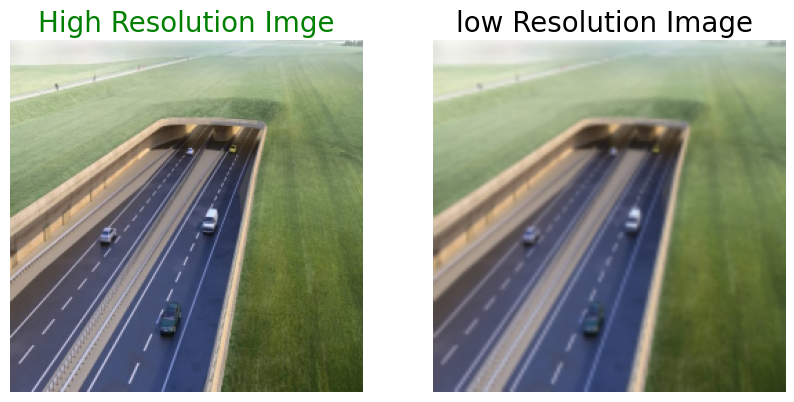

In [ ]:
for i in range(4):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

In [ ]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:830]
validation_low_image = low_img[700:830]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[830:]
test_low_image = low_img[830:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 256, 256, 3)
Shape of test images: (25, 256, 256, 3)
Shape of validation images: (130, 256, 256, 3)


In [ ]:

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def PSNR(y_true, y_pred):
    mse = tf.reduce_mean((y_true - y_pred) ** 2)
    return 20 * log10(1 / tf.math.sqrt(mse))

def pixel_MSE(y_true, y_pred):
    return tf.reduce_mean((y_true - y_pred) ** 2)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      663616    
                                                                 
 conv2d_2 (Conv2D)           (None, 256, 256, 32)      2080      
                                                                 
 conv2d_3 (Conv2D)           (None, 256, 256, 3)       2403      
                                                                 
Total params: 671683 (2.56 MB)
Trainable params: 671683 (2.56 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


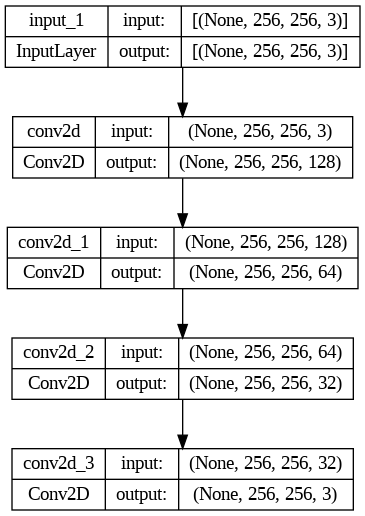

In [ ]:
from keras import layers
from tensorflow.keras.utils import plot_model


#SRCNN=tf.keras.models.Sequential([tf.keras.layers.Conv2D(64,9,padding='same',activation='relu'),
 #      tf.keras.layers.Conv2D(64,1,padding='same',activation='relu'),
 #      tf.keras.layers.Conv2D(3,5,padding='same',activation='relu')])

input_img=Input(shape=(256,256,3))
l1=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu') (input_img)
l2=tf.keras.layers.Conv2D(64,9,padding='same',activation='relu') (l1)
l3=tf.keras.layers.Conv2D(32,1,padding='same',activation='relu') (l2)
l4=tf.keras.layers.Conv2D(3,5,padding='same',activation='relu') (l3)


SRCNN=Model(input_img,l4)


def pixel_mse_loss(x,y):
    return tf.reduce_mean( (x - y) ** 2 )
SRCNN.compile(optimizer=tf.keras.optimizers.Adam(0.0001),loss=pixel_mse_loss,metrics=[PSNR, pixel_MSE])
SRCNN.summary()
plot_model(SRCNN, to_file ='super_res.png',show_shapes=True)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Adjust the learning rate
custom_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

# Compile the model with the new optimizer
SRCNN.compile(optimizer=custom_optimizer, loss=pixel_mse_loss, metrics=[PSNR, pixel_MSE])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
SRCNN.fit(train_low_image, train_high_image, epochs=20, batch_size=1,
          validation_data=(validation_low_image, validation_high_image),
          callbacks=[early_stopping])


Epoch 1/20
700/700 [==============================] - 57s 78ms/step - loss: 0.0014 - PSNR: 29.8950 - pixel_MSE: 0.0014 - val_loss: 0.0012 - val_PSNR: 30.3539 - val_pixel_MSE: 0.0012
Epoch 2/20
700/700 [==============================] - 55s 78ms/step - loss: 0.0013 - PSNR: 30.4111 - pixel_MSE: 0.0013 - val_loss: 0.0010 - val_PSNR: 31.1704 - val_pixel_MSE: 0.0010
Epoch 3/20
700/700 [==============================] - 53s 76ms/step - loss: 0.0011 - PSNR: 30.8037 - pixel_MSE: 0.0011 - val_loss: 0.0014 - val_PSNR: 29.3085 - val_pixel_MSE: 0.0014
Epoch 4/20
700/700 [==============================] - 53s 76ms/step - loss: 0.0011 - PSNR: 30.8098 - pixel_MSE: 0.0011 - val_loss: 0.0011 - val_PSNR: 30.6302 - val_pixel_MSE: 0.0011
Epoch 5/20
700/700 [==============================] - 53s 76ms/step - loss: 0.0014 - PSNR: 29.9809 - pixel_MSE: 0.0014 - val_loss: 0.0010 - val_PSNR: 31.1016 - val_pixel_MSE: 0.0010
Epoch 6/20
700/700 [==============================] - 54s 76ms/step - loss: 9.7344e-04 - P

In [ ]:
#loaded_model = load_model("/content/drive/MyDrive/m_project/models/srcnn_model.h5", custom_objects={'pixel_mse_loss': pixel_mse_loss, 'PSNR': PSNR, 'pixel_MSE': pixel_MSE})

1/1 [==============================] - 0s 60ms/step


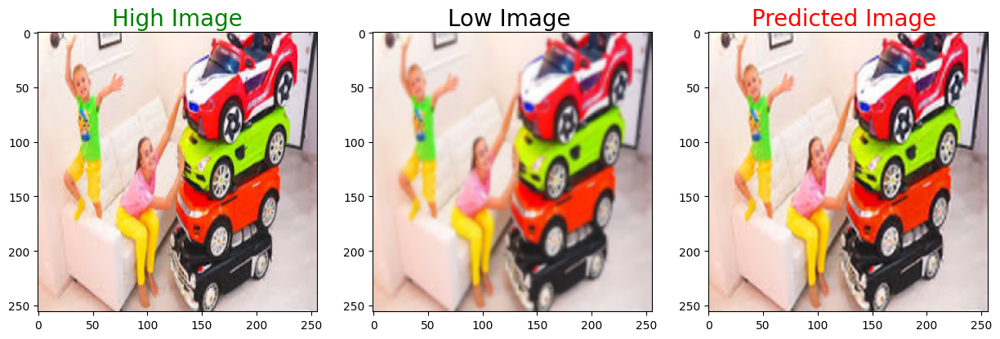

PSNR tf.Tensor(28.904264, shape=(), dtype=float32) dB SSIM tf.Tensor(0.93455553, shape=(), dtype=float32)
1/1 [==============================] - 0s 40ms/step


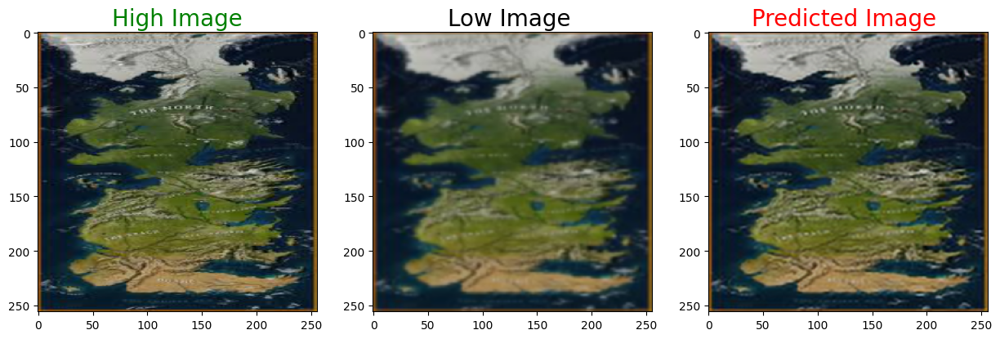

PSNR tf.Tensor(29.025421, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8763251, shape=(), dtype=float32)
1/1 [==============================] - 0s 52ms/step


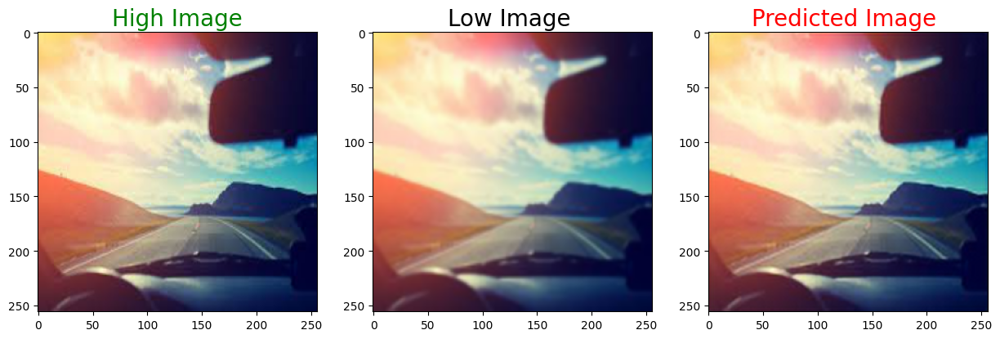

PSNR tf.Tensor(40.19302, shape=(), dtype=float32) dB SSIM tf.Tensor(0.98196214, shape=(), dtype=float32)
1/1 [==============================] - 0s 55ms/step


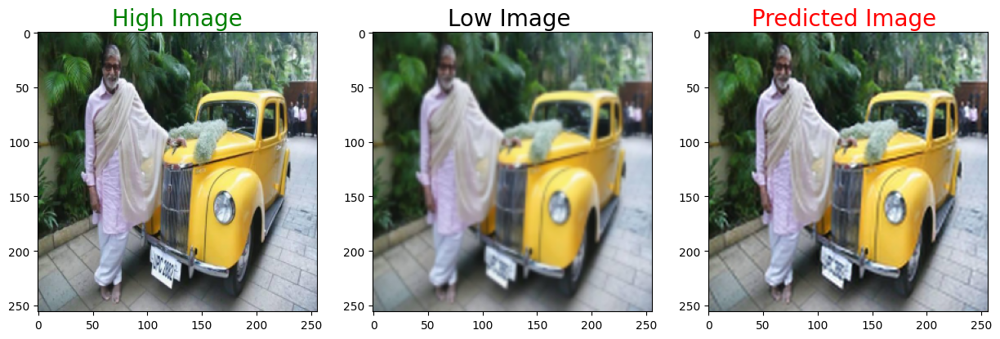

PSNR tf.Tensor(29.570694, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9029259, shape=(), dtype=float32)
1/1 [==============================] - 0s 61ms/step


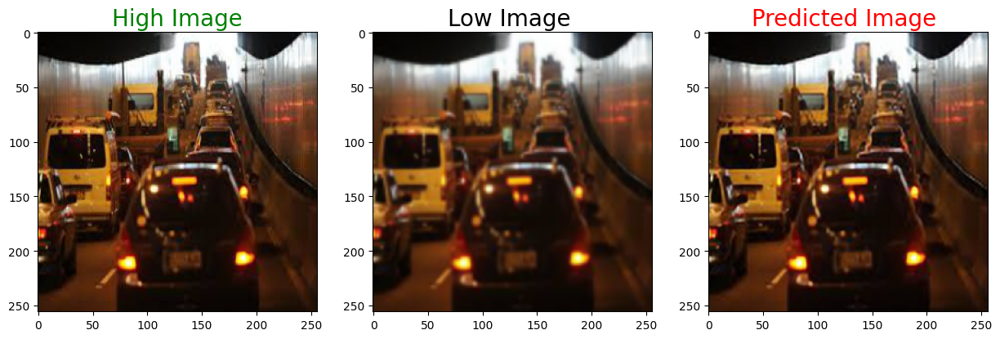

PSNR tf.Tensor(32.533455, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9504914, shape=(), dtype=float32)
1/1 [==============================] - 0s 31ms/step


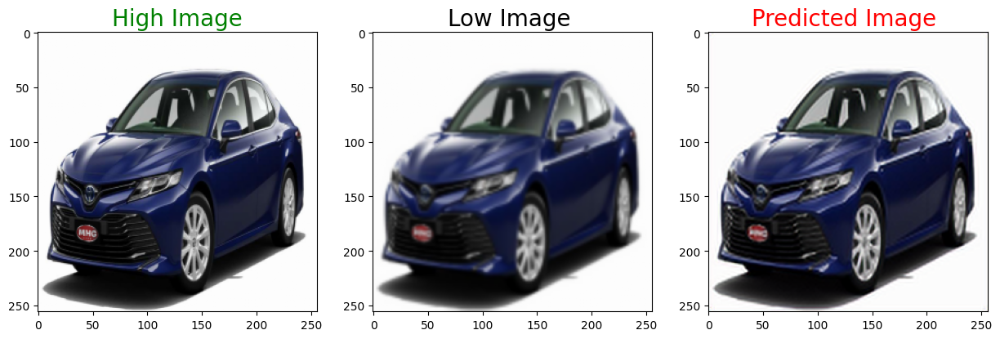

PSNR tf.Tensor(29.751846, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9459221, shape=(), dtype=float32)
1/1 [==============================] - 0s 33ms/step


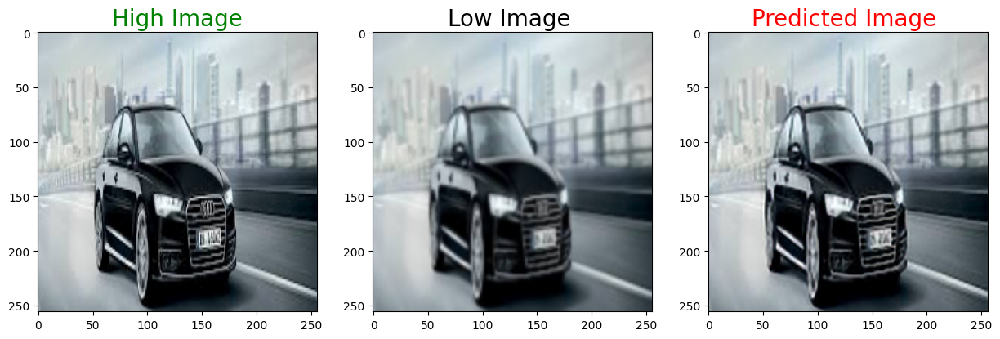

PSNR tf.Tensor(29.880217, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9494901, shape=(), dtype=float32)
1/1 [==============================] - 0s 38ms/step


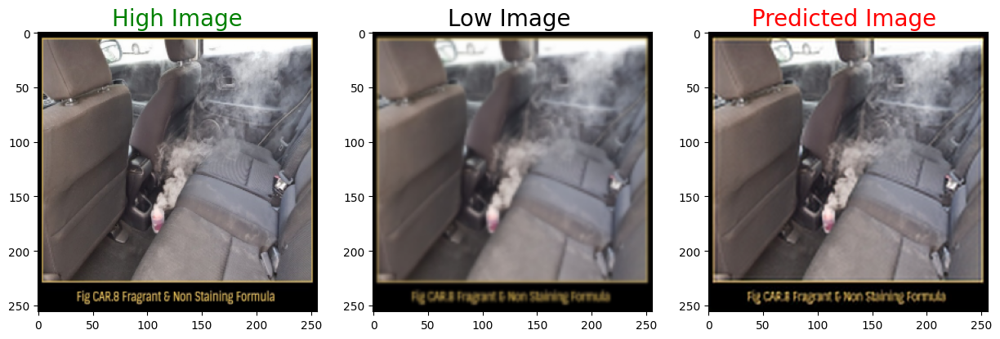

PSNR tf.Tensor(27.97127, shape=(), dtype=float32) dB SSIM tf.Tensor(0.91416097, shape=(), dtype=float32)
1/1 [==============================] - 0s 40ms/step


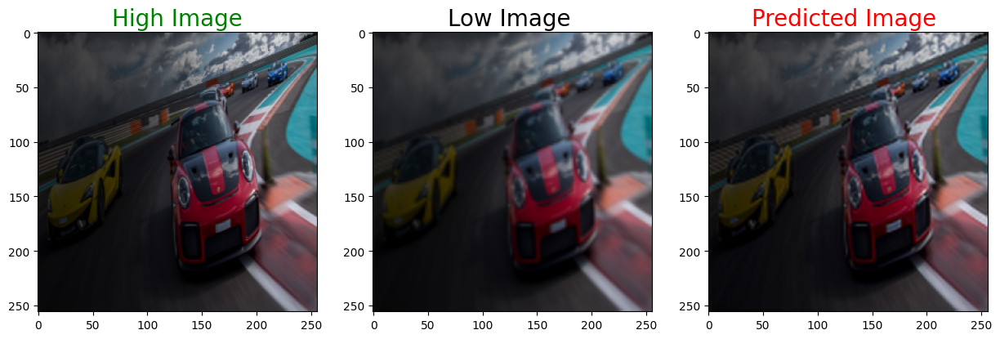

PSNR tf.Tensor(33.949104, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9471038, shape=(), dtype=float32)


In [ ]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()

for i in range(16,25):

    predicted = np.clip(SRCNN.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB', "SSIM",tf.image.ssim(test_high_image[i],predicted,max_val=1))

In [ ]:
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = '/content/drive/MyDrive/m_project/Set5/HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '5.png':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '/content/drive/MyDrive/m_project/Set5/LR/bicubic/x3'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '5.png':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        #img = downsample_image(img,2)
        low_img.append(img_to_array(img))

sett_high_image = high_img[1:]
sett_low_image = low_img[1:]
sett_high_image= np.reshape(sett_high_image,(len(sett_high_image),SIZE, SIZE,3))
sett_low_image = np.reshape(sett_low_image,(len(sett_low_image),SIZE,SIZE,3))

100%|██████████| 5/5 [00:01<00:00,  3.19it/s]


1/1 [==============================] - 0s 29ms/step


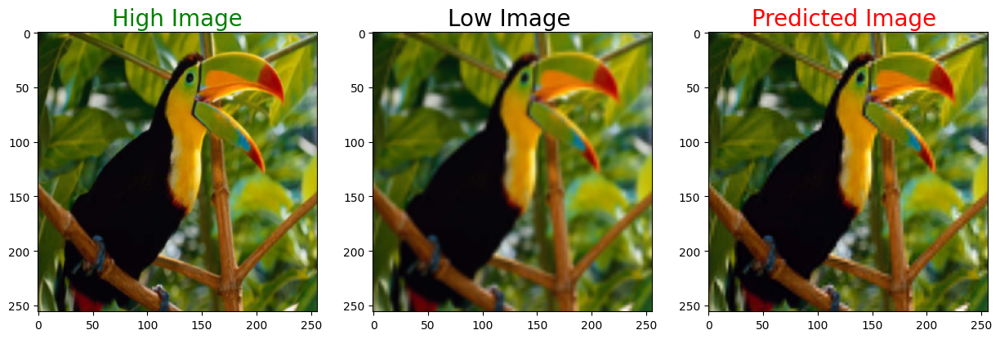

PSNR tf.Tensor(32.133366, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9307816, shape=(), dtype=float32)
1/1 [==============================] - 0s 34ms/step


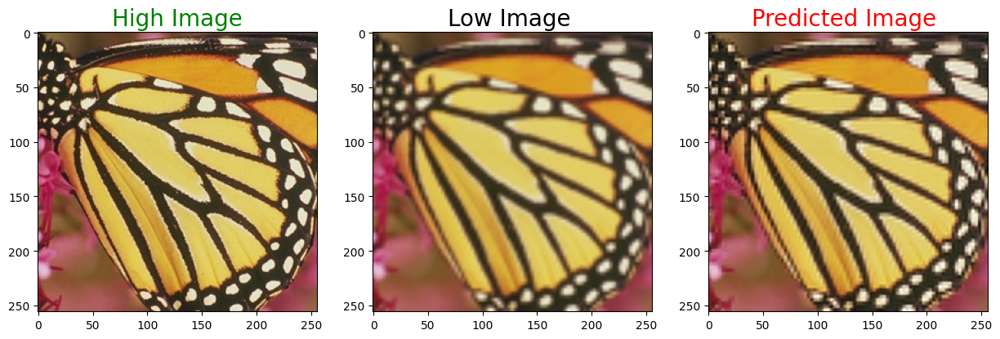

PSNR tf.Tensor(21.4201, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7695708, shape=(), dtype=float32)
1/1 [==============================] - 0s 31ms/step


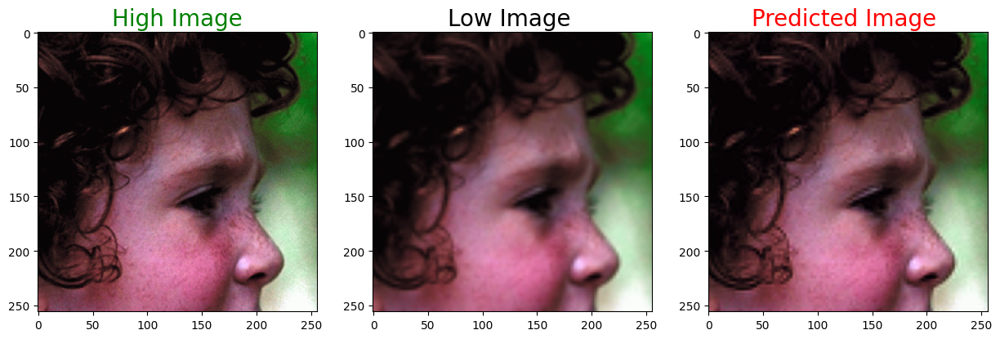

PSNR tf.Tensor(30.977385, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8227181, shape=(), dtype=float32)
1/1 [==============================] - 0s 37ms/step


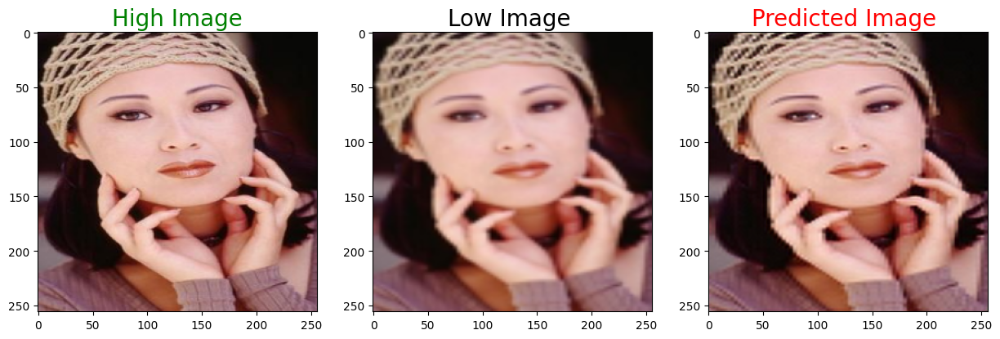

PSNR tf.Tensor(26.55024, shape=(), dtype=float32) dB SSIM tf.Tensor(0.87160736, shape=(), dtype=float32)


In [ ]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()

for i in range(0,4):

    predicted = np.clip(SRCNN.predict(sett_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(sett_high_image[i],sett_low_image[i],predicted)
    print('PSNR',PSNR(sett_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(sett_high_image[i],predicted,max_val=1))

In [ ]:
SRCNN.fit(train_low_image, train_high_image, epochs = 30, batch_size = 8,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/30
88/88 [==============================] - 46s 337ms/step - loss: 0.0206 - PSNR: 19.3379 - pixel_MSE: 0.0205 - val_loss: 0.0043 - val_PSNR: 23.6623 - val_pixel_MSE: 0.0044
Epoch 2/30
88/88 [==============================] - 26s 291ms/step - loss: 0.0028 - PSNR: 25.7210 - pixel_MSE: 0.0028 - val_loss: 0.0022 - val_PSNR: 26.7064 - val_pixel_MSE: 0.0022
Epoch 3/30
88/88 [==============================] - 26s 296ms/step - loss: 0.0018 - PSNR: 27.5788 - pixel_MSE: 0.0018 - val_loss: 0.0017 - val_PSNR: 27.6653 - val_pixel_MSE: 0.0018
Epoch 4/30
88/88 [==============================] - 27s 302ms/step - loss: 0.0015 - PSNR: 28.2484 - pixel_MSE: 0.0015 - val_loss: 0.0016 - val_PSNR: 27.9649 - val_pixel_MSE: 0.0016
Epoch 5/30
88/88 [==============================] - 27s 310ms/step - loss: 0.0014 - PSNR: 28.5913 - pixel_MSE: 0.0014 - val_loss: 0.0014 - val_PSNR: 28.6012 - val_pixel_MSE: 0.0014
Epoch 6/30
88/88 [==============================] - 27s 310ms/step - loss: 0.0013 - PSNR: 28.88